# Лабораторная 7 — Генерация лиц с помощью GAN

## 1. Импорты и настройка

In [3]:
import os, random, time, json, math, shutil
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torchvision
from torchvision import transforms
from torchvision.utils import make_grid

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')
print(f'PyTorch: {torch.__version__}, Torchvision: {torchvision.__version__}')
if device.type == 'cuda':
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} ГБ')

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if device.type == 'cuda':
    torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True

Device: cuda
PyTorch: 2.9.0+cu128, Torchvision: 0.24.0+cu128
GPU: NVIDIA GeForce RTX 3050
VRAM: 8.6 ГБ


## 2. Установка зависимостей

In [3]:
%pip install kaggle "torchmetrics[image]" scipy                                                       
%pip install --no-deps facenet-pytorch

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## 3. Скачивание CelebA

In [4]:
CELEBA_DIR = Path('DATA/CelebA')
CELEBA_DIR.mkdir(parents=True, exist_ok=True)

IMAGES_DIR = CELEBA_DIR / 'img_align_celeba' / 'img_align_celeba'
ATTR_CSV   = CELEBA_DIR / 'list_attr_celeba.csv'

if IMAGES_DIR.exists() and ATTR_CSV.exists() and any(IMAGES_DIR.iterdir()):
    n = sum(1 for _ in IMAGES_DIR.glob('*.jpg'))
    print(f'CelebA уже распакована: {n} изображений в {IMAGES_DIR}')
else:
    print('Скачиваем CelebA с Kaggle (~1.4 ГБ, несколько минут)...')
    t0 = time.time()
    from kaggle.api.kaggle_api_extended import KaggleApi
    api = KaggleApi()
    api.authenticate()
    api.dataset_download_files(
        'jessicali9530/celeba-dataset',
        path=str(CELEBA_DIR),
        unzip=True,
        quiet=False,
    )
    print(f'\nГотово за {(time.time() - t0)/60:.1f} мин')

print('\nСодержимое CELEBA_DIR:')
for p in sorted(CELEBA_DIR.iterdir()):
    print(f'  {p.name}')

n_images = sum(1 for _ in IMAGES_DIR.glob('*.jpg'))
print(f'\nИзображений в {IMAGES_DIR}: {n_images}')

CelebA уже распакована: 202599 изображений в DATA\CelebA\img_align_celeba\img_align_celeba

Содержимое CELEBA_DIR:
  img_align_celeba
  list_attr_celeba.csv
  list_bbox_celeba.csv
  list_eval_partition.csv
  list_landmarks_align_celeba.csv

Изображений в DATA\CelebA\img_align_celeba\img_align_celeba: 202599


## 4. Атрибуты и демонстрация выровненных лиц

Загружено 202599 строк атрибутов, 41 колонок

Баланс пола (Male = 1):
  мужчин:   84434  (41.7%)
  женщин:  118165  (58.3%)


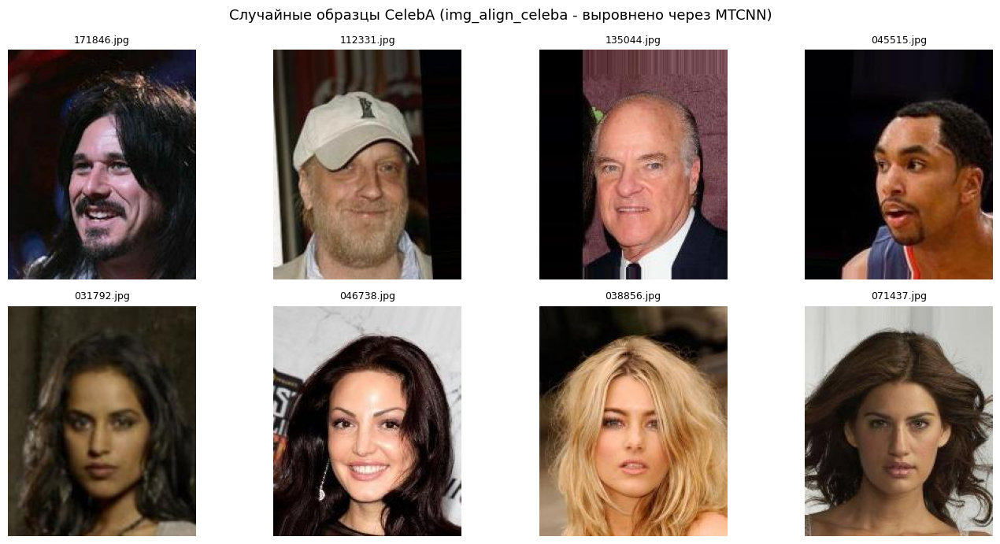

In [5]:
attrs = pd.read_csv(ATTR_CSV)
print(f'Загружено {len(attrs)} строк атрибутов, {attrs.shape[1]} колонок')

attrs['Male'] = (attrs['Male'] == 1).astype(int)

LABEL_BY_FILE = dict(zip(attrs['image_id'], attrs['Male']))

n_male   = int(attrs['Male'].sum())
n_female = len(attrs) - n_male
print(f'\nБаланс пола (Male = 1):')
print(f'  мужчин:  {n_male:6d}  ({n_male / len(attrs) * 100:.1f}%)')
print(f'  женщин:  {n_female:6d}  ({n_female / len(attrs) * 100:.1f}%)')

def get_sample(label, k=4):
    rows = attrs[attrs['Male'] == label].sample(n=k, random_state=SEED)
    return rows['image_id'].tolist()

male_samples   = get_sample(1, 4)
female_samples = get_sample(0, 4)

fig, axes = plt.subplots(2, 4, figsize=(14, 7))
for ax, fname in zip(axes[0], male_samples):
    ax.imshow(Image.open(IMAGES_DIR / fname))
    ax.set_title(fname, fontsize=9)
    ax.axis('off')
for ax, fname in zip(axes[1], female_samples):
    ax.imshow(Image.open(IMAGES_DIR / fname))
    ax.set_title(fname, fontsize=9)
    ax.axis('off')

axes[0, 0].set_ylabel('Male', fontsize=12, rotation=90, labelpad=15)
axes[1, 0].set_ylabel('Female', fontsize=12, rotation=90, labelpad=15)
plt.suptitle('Случайные образцы CelebA (img_align_celeba - выровнено через MTCNN)', fontsize=13)
plt.tight_layout()
plt.show()

## 5. Демонстрация детектора лиц (MTCNN)

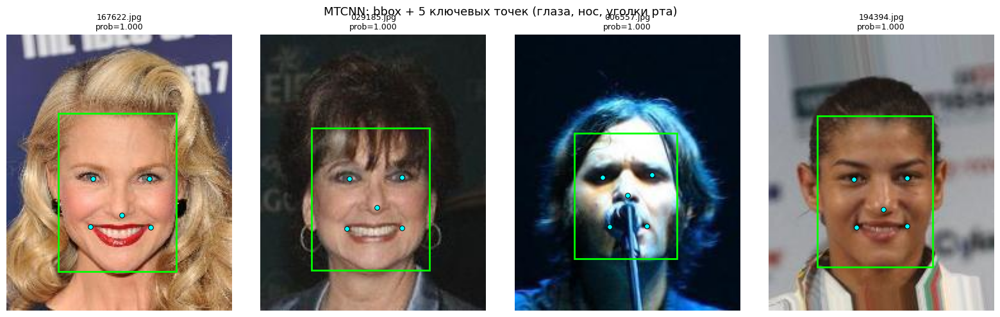

In [6]:
import matplotlib.patches as patches
from facenet_pytorch import MTCNN

mtcnn = MTCNN(keep_all=True, device=device, post_process=False)

random.seed(SEED)
sample_files = random.sample(list(LABEL_BY_FILE.keys()), 4)

fig, axes = plt.subplots(1, 4, figsize=(16, 5))
for ax, fname in zip(axes, sample_files):
    img = Image.open(IMAGES_DIR / fname).convert('RGB')
    boxes, probs, landmarks = mtcnn.detect(img, landmarks=True)

    ax.imshow(img)
    if boxes is not None:
        for box, lm, p in zip(boxes, landmarks, probs):
            x1, y1, x2, y2 = box
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            for (px, py) in lm:
                ax.scatter(px, py, color='cyan', s=30, edgecolors='black', linewidths=0.7)
            ax.set_title(f'{fname}\nprob={p:.3f}', fontsize=9)
    else:
        ax.set_title(f'{fname}\n(не найдено)', fontsize=9)
    ax.axis('off')

plt.suptitle('MTCNN: bbox + 5 ключевых точек (глаза, нос, уголки рта)', fontsize=13)
plt.tight_layout()
plt.show()

## 6. Dataset и DataLoader

Размер датасета: 202599 изображений
Батчей в эпохе:  3165 (по 64 картинок)

batch.images shape : torch.Size([64, 3, 128, 128]), dtype=torch.float32, [-1.00, 1.00]
batch.labels shape : torch.Size([64]), sample: [0, 1, 1, 0, 0, 1, 1, 0]


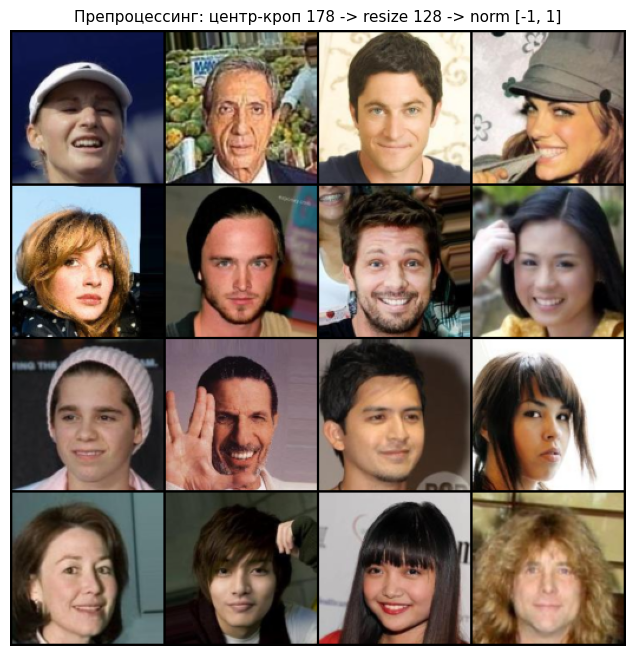

In [6]:
IMG_SIZE  = 128
BATCH     = 64

train_transform = transforms.Compose([
    transforms.CenterCrop(178),
    transforms.Resize(IMG_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]), 
])


class CelebADataset(data.Dataset):
    def __init__(self, images_dir: Path, label_by_file: dict, transform=None):
        self.images_dir = images_dir
        self.transform  = transform
        self.files = sorted(label_by_file.keys())
        self.labels = label_by_file

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx]
        img = Image.open(self.images_dir / fname).convert('RGB')
        if self.transform:
            img = self.transform(img)
        label = self.labels[fname]
        return img, label


train_dataset = CelebADataset(IMAGES_DIR, LABEL_BY_FILE, transform=train_transform)
train_loader = data.DataLoader(
    train_dataset,
    batch_size=BATCH,
    shuffle=True,
    num_workers=0,        
    pin_memory=True,
    drop_last=True,      
)

print(f'Размер датасета: {len(train_dataset)} изображений')
print(f'Батчей в эпохе:  {len(train_loader)} (по {BATCH} картинок)')

imgs, labels = next(iter(train_loader))
print(f'\nbatch.images shape : {imgs.shape}, dtype={imgs.dtype}, [{imgs.min():.2f}, {imgs.max():.2f}]')
print(f'batch.labels shape : {labels.shape}, sample: {labels[:8].tolist()}')

def denorm(t):
    return ((t + 1) / 2).clamp(0, 1)

grid = make_grid(denorm(imgs[:16]), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.axis('off')
plt.title('Препроцессинг: центр-кроп 178 -> resize 128 -> norm [-1, 1]', fontsize=11)
plt.show()

## 7. Архитектура Generator (DCGAN, 128×128)

In [5]:
Z_DIM = 100
NGF   = 64   


def dcgan_init(m):
    name = m.__class__.__name__
    if 'Conv' in name:
        nn.init.normal_(m.weight, 0.0, 0.02)
    elif 'BatchNorm' in name:
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.zeros_(m.bias)


class Generator(nn.Module):
    def __init__(self, z_dim=Z_DIM, ngf=NGF):
        super().__init__()
        self.main = nn.Sequential(
            # (B, z_dim, 1, 1) -> (B, ngf*16, 4, 4)
            nn.ConvTranspose2d(z_dim, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # 4x4 -> 8x8
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # 8x8 -> 16x16
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # 16x16 -> 32x32
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # 32x32 -> 64x64
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # 64x64 -> 128x128
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh(),
        )

    def forward(self, z):
        if z.dim() == 2:
            z = z.unsqueeze(-1).unsqueeze(-1)
        return self.main(z)


G = Generator().to(device)
G.apply(dcgan_init)

n_params = sum(p.numel() for p in G.parameters())
print(f'Generator: {n_params/1e6:.2f}M параметров')

with torch.no_grad():
    z = torch.randn(2, Z_DIM, device=device)
    out = G(z)
print(f'Forward: z {tuple(z.shape)} -> out {tuple(out.shape)} ([{out.min():.2f}, {out.max():.2f}])')

Generator: 12.79M параметров
Forward: z (2, 100) -> out (2, 3, 128, 128) ([-0.73, 0.82])


## 8. Архитектура Discriminator

In [7]:
NDF = 64  


class Discriminator(nn.Module):
    def __init__(self, ndf=NDF):
        super().__init__()
        self.main = nn.Sequential(
            # 128x128 -> 64x64
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 64 -> 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # 32 -> 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # 16 -> 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # 8 -> 4
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # 4x4 -> 1x1: 
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
        )

    def forward(self, x):
        return self.main(x).view(-1)


D = Discriminator().to(device)
D.apply(dcgan_init)

n_params = sum(p.numel() for p in D.parameters())
print(f'Discriminator: {n_params/1e6:.2f}M параметров')

with torch.no_grad():
    fake = G(torch.randn(2, Z_DIM, device=device))
    logits = D(fake)
print(f'Forward: img {tuple(fake.shape)} -> logits {tuple(logits.shape)}, values: {logits.tolist()}')

Discriminator: 11.16M параметров
Forward: img (2, 3, 128, 128) -> logits (2,), values: [0.688011884689331, 2.1329243183135986]


## 9. Обучение DCGAN 

In [ ]:
EPOCHS    = 10
LR        = 2e-4
BETA1     = 0.5
SAMPLE_EVERY = 1     

RUN_DIR = Path('runs/gan')
RUN_DIR.mkdir(parents=True, exist_ok=True)

G = Generator().to(device); G.apply(dcgan_init)
D = Discriminator().to(device); D.apply(dcgan_init)

opt_G = torch.optim.Adam(G.parameters(), lr=LR, betas=(BETA1, 0.999))
opt_D = torch.optim.Adam(D.parameters(), lr=LR, betas=(BETA1, 0.999))

bce = nn.BCEWithLogitsLoss()

fixed_noise = torch.randn(64, Z_DIM, device=device)

history = {'loss_D': [], 'loss_G': [], 'epoch_samples': []}

print(f'Стартуем обучение: {EPOCHS} эпох x {len(train_loader)} батчей')
t_total = time.time()

for epoch in range(EPOCHS):
    G.train(); D.train()
    e_loss_D = e_loss_G = 0.0
    t_epoch = time.time()

    for i, (real, _) in enumerate(train_loader):
        real = real.to(device, non_blocking=True)
        bs = real.size(0)
        ones  = torch.ones (bs, device=device)
        zeros = torch.zeros(bs, device=device)

        # === 1. Шаг дискриминатора ===
        opt_D.zero_grad(set_to_none=True)
        d_real = D(real)
        loss_real = bce(d_real, ones)
        z = torch.randn(bs, Z_DIM, device=device)
        fake = G(z)
        d_fake = D(fake.detach())
        loss_fake = bce(d_fake, zeros)
        loss_D = loss_real + loss_fake
        loss_D.backward()
        opt_D.step()

        # === 2. Шаг генератора ===
        opt_G.zero_grad(set_to_none=True)
        d_fake_for_G = D(fake)
        loss_G = bce(d_fake_for_G, ones)   
        loss_G.backward()
        opt_G.step()

        e_loss_D += loss_D.item()
        e_loss_G += loss_G.item()

        if (i + 1) % 200 == 0:
            print(f'  ep{epoch+1} batch {i+1}/{len(train_loader)} '
                  f'| D: {loss_D.item():.3f} G: {loss_G.item():.3f}')

    e_loss_D /= len(train_loader)
    e_loss_G /= len(train_loader)
    history['loss_D'].append(e_loss_D)
    history['loss_G'].append(e_loss_G)

    G.eval()
    with torch.no_grad():
        samples = G(fixed_noise).cpu()
    history['epoch_samples'].append(samples)

    print(f'Epoch {epoch+1}/{EPOCHS} | loss_D={e_loss_D:.3f} loss_G={e_loss_G:.3f} '
          f'| time {time.time() - t_epoch:.0f}s')

torch.save({'G': G.state_dict(), 'D': D.state_dict()}, RUN_DIR / 'dcgan.pt')
print(f'\nГотово за {(time.time() - t_total)/60:.1f} мин. Веса: {RUN_DIR / "dcgan.pt"}')

Стартуем обучение: 10 эпох x 3165 батчей
  ep1 batch 200/3165 | D: 0.527 G: 3.887
  ep1 batch 400/3165 | D: 0.511 G: 3.019
  ep1 batch 600/3165 | D: 0.745 G: 7.657
  ep1 batch 800/3165 | D: 0.620 G: 4.129
  ep1 batch 1000/3165 | D: 0.464 G: 3.952
  ep1 batch 1200/3165 | D: 0.679 G: 4.260
  ep1 batch 1400/3165 | D: 0.785 G: 5.671
  ep1 batch 1600/3165 | D: 0.664 G: 4.881
  ep1 batch 1800/3165 | D: 0.698 G: 5.066
  ep1 batch 2000/3165 | D: 0.564 G: 5.220
  ep1 batch 2200/3165 | D: 0.594 G: 2.641
  ep1 batch 2400/3165 | D: 0.620 G: 5.328
  ep1 batch 2600/3165 | D: 0.907 G: 5.937
  ep1 batch 2800/3165 | D: 1.946 G: 1.029
  ep1 batch 3000/3165 | D: 0.673 G: 2.289
Epoch 1/10 | loss_D=0.933 loss_G=5.503 | time 2563s
  ep2 batch 200/3165 | D: 0.316 G: 3.839
  ep2 batch 400/3165 | D: 0.701 G: 2.993
  ep2 batch 600/3165 | D: 0.502 G: 2.793
  ep2 batch 800/3165 | D: 0.447 G: 2.713
  ep2 batch 1000/3165 | D: 0.822 G: 2.887
  ep2 batch 1200/3165 | D: 0.773 G: 2.747
  ep2 batch 1400/3165 | D: 1.225 

## 10. Результаты DCGAN: кривые обучения + лица + таймлайн

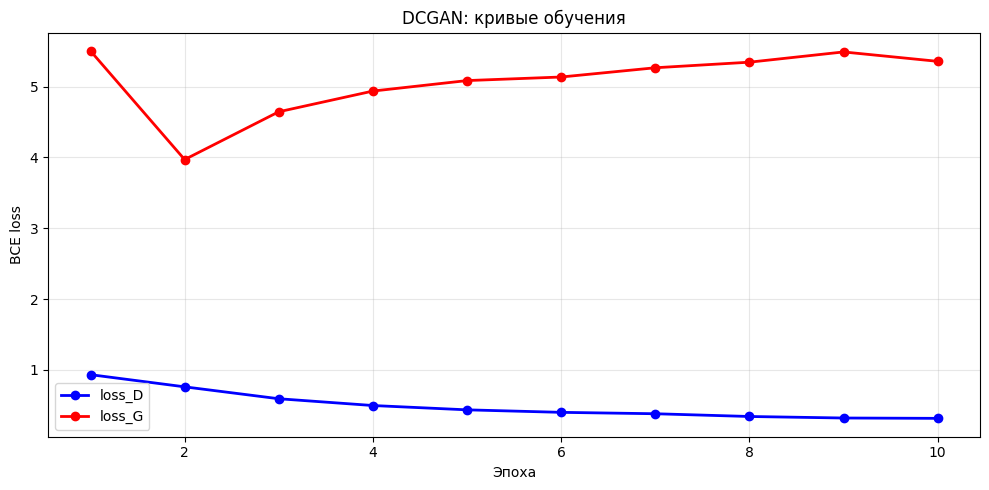

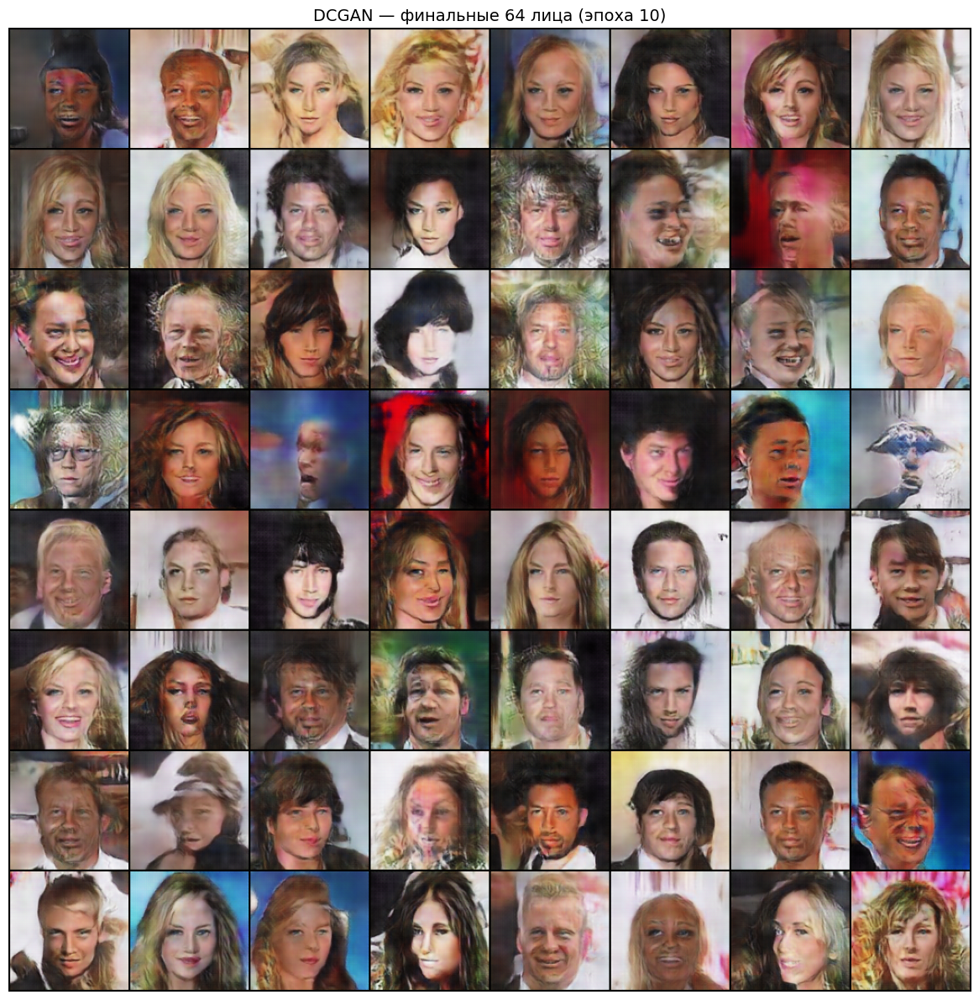

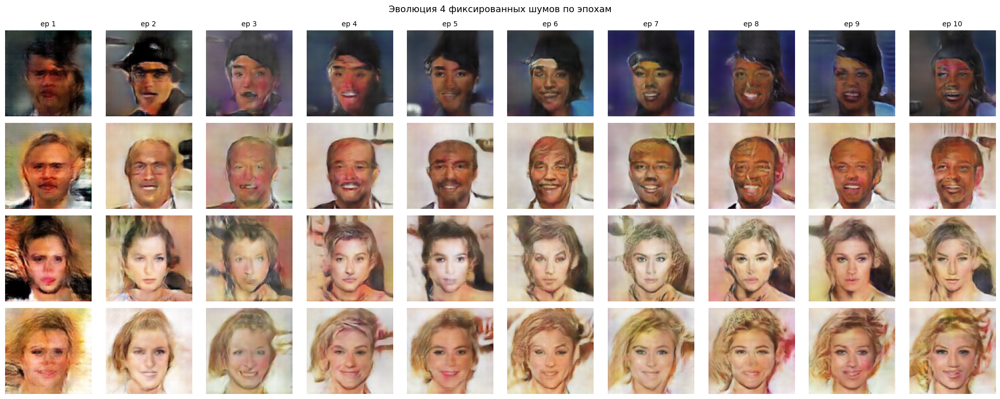

In [11]:
# 1. Loss-кривые
plt.figure(figsize=(10, 5))
xs = range(1, len(history['loss_D']) + 1)
plt.plot(xs, history['loss_D'], 'b-o', label='loss_D', linewidth=2)
plt.plot(xs, history['loss_G'], 'r-o', label='loss_G', linewidth=2)
plt.xlabel('Эпоха')
plt.ylabel('BCE loss')
plt.title('DCGAN: кривые обучения')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# 2. Финальные 64 лица из fixed_noise
final_samples = history['epoch_samples'][-1]      
grid = make_grid(denorm(final_samples), nrow=8)
plt.figure(figsize=(12, 12))
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.axis('off')
plt.title(f'DCGAN — финальные 64 лица (эпоха {len(history["loss_D"])})', fontsize=14)
plt.tight_layout()
plt.show()


# 3. Таймлайн: 4 фиксированных шума, эволюция по эпохам
N_TRACK   = 4
n_epochs  = len(history['epoch_samples'])

fig, axes = plt.subplots(N_TRACK, n_epochs, figsize=(n_epochs * 2, N_TRACK * 2))
for row in range(N_TRACK):
    for ep, samples in enumerate(history['epoch_samples']):
        ax = axes[row, ep] if n_epochs > 1 else axes[row]
        img = denorm(samples[row]).permute(1, 2, 0).numpy()
        ax.imshow(img)
        ax.axis('off')
        if row == 0:
            ax.set_title(f'ep {ep+1}', fontsize=10)
        if ep == 0:
            ax.set_ylabel(f'face #{row+1}', fontsize=10, rotation=90, labelpad=10)

plt.suptitle('Эволюция 4 фиксированных шумов по эпохам', fontsize=13)
plt.tight_layout()
plt.show()

## 11. Conditional GAN - генерация лиц по полу

In [9]:
N_CLASSES = 2   
IMG_SIZE  = 128
BATCH     = 64

class ConditionalGenerator(nn.Module):
    def __init__(self, z_dim=Z_DIM, n_classes=N_CLASSES, ngf=NGF):
        super().__init__()
        self.n_classes = n_classes
        in_dim = z_dim + n_classes   

        self.main = nn.Sequential(
            nn.ConvTranspose2d(in_dim, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16), nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),  nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),  nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),  nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),      nn.ReLU(True),
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh(),
        )

    def forward(self, z, y):
        y_oh = F.one_hot(y, num_classes=self.n_classes).float()
        zy = torch.cat([z, y_oh], dim=1)
        zy = zy.unsqueeze(-1).unsqueeze(-1)
        return self.main(zy)


class ConditionalDiscriminator(nn.Module):
    def __init__(self, n_classes=N_CLASSES, ndf=NDF, img_size=IMG_SIZE):
        super().__init__()
        self.n_classes = n_classes
        self.img_size  = img_size
        in_ch = 3 + n_classes

        self.main = nn.Sequential(
            nn.Conv2d(in_ch, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
        )

    def forward(self, x, y):
        y_oh = F.one_hot(y, num_classes=self.n_classes).float()
        y_sp = y_oh.view(-1, self.n_classes, 1, 1).expand(-1, -1, self.img_size, self.img_size)
        xy = torch.cat([x, y_sp], dim=1) 
        return self.main(xy).view(-1)


G_c = ConditionalGenerator().to(device); G_c.apply(dcgan_init)
D_c = ConditionalDiscriminator().to(device); D_c.apply(dcgan_init)

print(f'cGenerator:     {sum(p.numel() for p in G_c.parameters())/1e6:.2f}M параметров')
print(f'cDiscriminator: {sum(p.numel() for p in D_c.parameters())/1e6:.2f}M параметров')

with torch.no_grad():
    z = torch.randn(4, Z_DIM, device=device)
    y = torch.tensor([0, 1, 0, 1], device=device)
    fake = G_c(z, y)
    logits = D_c(fake, y)
print(f'\nG forward: z {tuple(z.shape)}, y {tuple(y.shape)} -> img {tuple(fake.shape)}')
print(f'D forward: img {tuple(fake.shape)}, y {tuple(y.shape)} -> logits {tuple(logits.shape)}')

cGenerator:     12.82M параметров
cDiscriminator: 11.17M параметров

G forward: z (4, 100), y (4,) -> img (4, 3, 128, 128)
D forward: img (4, 3, 128, 128), y (4,) -> logits (4,)


## 13. Обучение Conditional GAN

In [ ]:
EPOCHS_C = 10

G_c = ConditionalGenerator().to(device); G_c.apply(dcgan_init)
D_c = ConditionalDiscriminator().to(device); D_c.apply(dcgan_init)

opt_G_c = torch.optim.Adam(G_c.parameters(), lr=LR, betas=(BETA1, 0.999))
opt_D_c = torch.optim.Adam(D_c.parameters(), lr=LR, betas=(BETA1, 0.999))

fixed_noise_c = torch.randn(64, Z_DIM, device=device)
fixed_labels  = torch.cat([
    torch.zeros(32, dtype=torch.long, device=device), 
    torch.ones (32, dtype=torch.long, device=device),
])

history_c = {'loss_D': [], 'loss_G': [], 'epoch_samples': []}

print(f'Стартуем cGAN: {EPOCHS_C} эпох x {len(train_loader)} батчей')
t_total = time.time()

for epoch in range(EPOCHS_C):
    G_c.train(); D_c.train()
    e_loss_D = e_loss_G = 0.0
    t_epoch = time.time()

    for i, (real, y_real) in enumerate(train_loader):
        real   = real.to(device, non_blocking=True)
        y_real = y_real.to(device, non_blocking=True).long()
        bs = real.size(0)
        ones  = torch.ones (bs, device=device)
        zeros = torch.zeros(bs, device=device)

        # === D шаг ===
        opt_D_c.zero_grad(set_to_none=True)
        d_real = D_c(real, y_real)
        loss_real = bce(d_real, ones)

        z = torch.randn(bs, Z_DIM, device=device)
        y_fake = torch.randint(0, N_CLASSES, (bs,), device=device)
        fake = G_c(z, y_fake)
        d_fake = D_c(fake.detach(), y_fake)
        loss_fake = bce(d_fake, zeros)

        loss_D = loss_real + loss_fake
        loss_D.backward()
        opt_D_c.step()

        # === G шаг ===
        opt_G_c.zero_grad(set_to_none=True)
        d_fake_g = D_c(fake, y_fake)
        loss_G = bce(d_fake_g, ones)
        loss_G.backward()
        opt_G_c.step()

        e_loss_D += loss_D.item()
        e_loss_G += loss_G.item()

        if (i + 1) % 200 == 0:
            print(f'  ep{epoch+1} batch {i+1}/{len(train_loader)} | D: {loss_D.item():.3f} G: {loss_G.item():.3f}')

    e_loss_D /= len(train_loader)
    e_loss_G /= len(train_loader)
    history_c['loss_D'].append(e_loss_D)
    history_c['loss_G'].append(e_loss_G)

    G_c.eval()
    with torch.no_grad():
        samples = G_c(fixed_noise_c, fixed_labels).cpu()
    history_c['epoch_samples'].append(samples)

    print(f'Epoch {epoch+1}/{EPOCHS_C} | loss_D={e_loss_D:.3f} loss_G={e_loss_G:.3f} '
          f'| time {time.time() - t_epoch:.0f}s')

torch.save({'G': G_c.state_dict(), 'D': D_c.state_dict()}, RUN_DIR / 'cgan.pt')
print(f'\nГотово за {(time.time() - t_total)/60:.1f} мин. Веса: {RUN_DIR / "cgan.pt"}')

Стартуем cGAN: 10 эпох x 3165 батчей
  ep1 batch 200/3165 | D: 1.293 G: 1.872
  ep1 batch 400/3165 | D: 0.985 G: 2.468
  ep1 batch 600/3165 | D: 0.186 G: 3.967
  ep1 batch 800/3165 | D: 0.554 G: 2.184
  ep1 batch 1000/3165 | D: 0.557 G: 1.868
  ep1 batch 1200/3165 | D: 0.878 G: 1.871
  ep1 batch 1400/3165 | D: 1.906 G: 1.699
  ep1 batch 1600/3165 | D: 0.308 G: 2.352
  ep1 batch 1800/3165 | D: 0.436 G: 2.837
  ep1 batch 2000/3165 | D: 3.392 G: 0.360
  ep1 batch 2200/3165 | D: 0.853 G: 1.156
  ep1 batch 2400/3165 | D: 0.617 G: 1.221
  ep1 batch 2600/3165 | D: 1.809 G: 0.959
  ep1 batch 2800/3165 | D: 0.883 G: 1.075
  ep1 batch 3000/3165 | D: 1.185 G: 0.691
Epoch 1/10 | loss_D=1.161 loss_G=2.390 | time 30985s
  ep2 batch 200/3165 | D: 0.354 G: 1.804
  ep2 batch 400/3165 | D: 1.134 G: 1.149
  ep2 batch 600/3165 | D: 2.018 G: 0.399
  ep2 batch 800/3165 | D: 1.438 G: 0.801
  ep2 batch 1000/3165 | D: 3.002 G: 0.259
  ep2 batch 1200/3165 | D: 1.075 G: 1.375
  ep2 batch 1400/3165 | D: 2.777 G: 

## 14. Результаты cGAN: кривые + одни шумы, разные метки

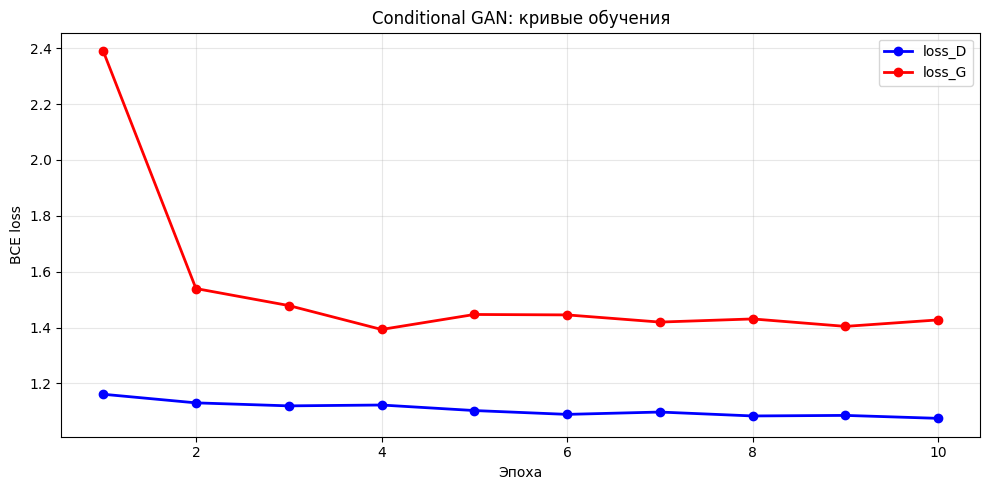

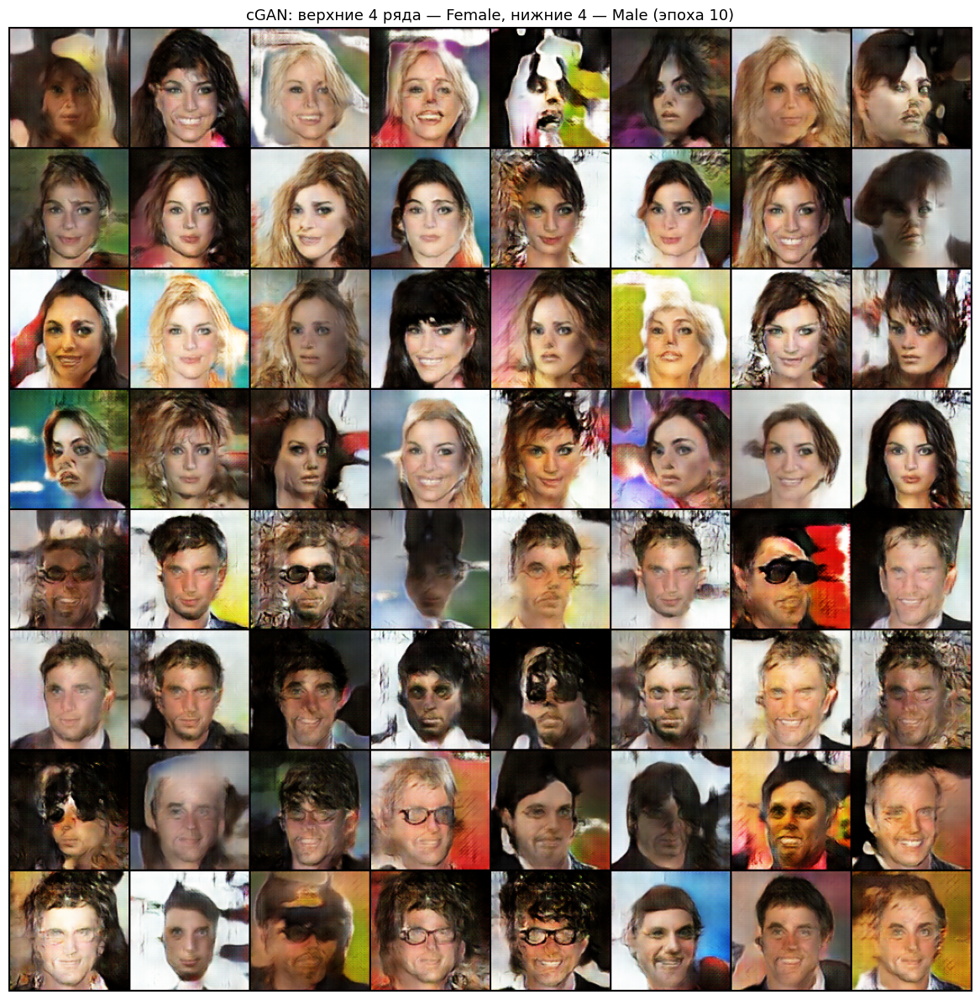

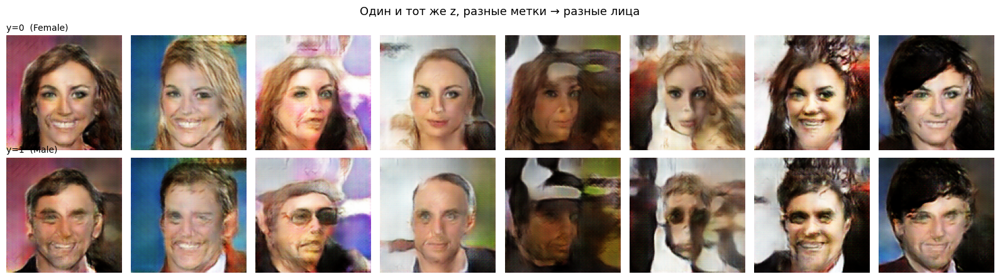

In [14]:
# 1. Loss-кривые
plt.figure(figsize=(10, 5))
xs = range(1, len(history_c['loss_D']) + 1)
plt.plot(xs, history_c['loss_D'], 'b-o', label='loss_D', linewidth=2)
plt.plot(xs, history_c['loss_G'], 'r-o', label='loss_G', linewidth=2)
plt.xlabel('Эпоха'); plt.ylabel('BCE loss')
plt.title('Conditional GAN: кривые обучения')
plt.legend(); plt.grid(True, alpha=0.3); plt.tight_layout(); plt.show()

# 2. Финальная сетка 8x8 (слева женщины, справа мужчины)
final_c = history_c['epoch_samples'][-1]
grid = make_grid(denorm(final_c), nrow=8)
plt.figure(figsize=(12, 12))
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.axis('off')
plt.title(f'cGAN: верхние 4 ряда — Female, нижние 4 — Male (эпоха {len(history_c["loss_D"])})', fontsize=13)
plt.tight_layout(); plt.show()

# 3. Один шум, разные метки — пары Female/Male
N_PAIRS = 8
G_c.eval()
with torch.no_grad():
    z_pair  = torch.randn(N_PAIRS, Z_DIM, device=device)
    z_full  = torch.cat([z_pair, z_pair], dim=0)                                # 2*N
    y_full  = torch.cat([torch.zeros(N_PAIRS, dtype=torch.long, device=device),
                         torch.ones (N_PAIRS, dtype=torch.long, device=device)])
    pair_imgs = G_c(z_full, y_full).cpu()

fig, axes = plt.subplots(2, N_PAIRS, figsize=(N_PAIRS * 2, 4.5))
for i in range(N_PAIRS):
    img_f = denorm(pair_imgs[i]).permute(1, 2, 0).numpy()
    img_m = denorm(pair_imgs[i + N_PAIRS]).permute(1, 2, 0).numpy()
    axes[0, i].imshow(img_f); axes[0, i].axis('off')
    axes[1, i].imshow(img_m); axes[1, i].axis('off')
    if i == 0:
        axes[0, i].set_title('y=0  (Female)', loc='left', fontsize=10)
        axes[1, i].set_title('y=1  (Male)', loc='left', fontsize=10)
plt.suptitle('Один и тот же z, разные метки → разные лица', fontsize=13)
plt.tight_layout(); plt.show()

## 15. Метрики FID и IS

In [ ]:
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore

N_SAMPLES = 1000
EVAL_BATCH = 64


def to_uint8(x: torch.Tensor) -> torch.Tensor:
    x = ((x + 1) / 2).clamp(0, 1)
    return (x * 255).to(torch.uint8)


def gather_real(loader, n: int):
    out = []
    seen = 0
    for real, _ in loader:
        out.append(to_uint8(real))
        seen += real.size(0)
        if seen >= n:
            break
    real = torch.cat(out, dim=0)[:n]
    return real


def gather_fake(generator, n: int, conditional: bool):
    generator.eval()
    out = []
    while sum(t.size(0) for t in out) < n:
        bs = EVAL_BATCH
        z = torch.randn(bs, Z_DIM, device=device)
        with torch.no_grad():
            if conditional:
                y = torch.randint(0, N_CLASSES, (bs,), device=device)
                fake = generator(z, y)
            else:
                fake = generator(z)
        out.append(to_uint8(fake).cpu())
    fake = torch.cat(out, dim=0)[:n]
    return fake


def compute_fid_is(real_u8: torch.Tensor, fake_u8: torch.Tensor):
    fid = FrechetInceptionDistance(feature=2048, normalize=False).to(device)
    iscore = InceptionScore(feature=2048, splits=10, normalize=False).to(device)
    for i in range(0, len(real_u8), EVAL_BATCH):
        fid.update(real_u8[i:i+EVAL_BATCH].to(device), real=True)
    for i in range(0, len(fake_u8), EVAL_BATCH):
        b = fake_u8[i:i+EVAL_BATCH].to(device)
        fid.update(b, real=False)
        iscore.update(b)
    fid_val = fid.compute().item()
    is_mean, is_std = iscore.compute()
    return fid_val, is_mean.item(), is_std.item()


# 1. Сэмплим один и тот же набор реальных лиц для обеих оценок
print(f"Собираем {N_SAMPLES} реальных лиц...")
t0 = time.time()
real_u8 = gather_real(train_loader, N_SAMPLES)
print(f"  {real_u8.shape}, dtype={real_u8.dtype}, time={time.time()-t0:.0f}s")

# 2. DCGAN
print(f"Генерируем фейки DCGAN...")
fake_dc = gather_fake(G, N_SAMPLES, conditional=False)
fid_dc, is_dc, isstd_dc = compute_fid_is(real_u8, fake_dc)
print(f"DCGAN  | FID = {fid_dc:.2f} | IS = {is_dc:.3f} ± {isstd_dc:.3f}")

# 3. cGAN
print(f"Генерируем фейки cGAN...")
fake_cg = gather_fake(G_c, N_SAMPLES, conditional=True)
fid_cg, is_cg, isstd_cg = compute_fid_is(real_u8, fake_cg)
print(f"cGAN   | FID = {fid_cg:.2f} | IS = {is_cg:.3f} ± {isstd_cg:.3f}")

# Свод
print(f"{''*40}")
print(f"  Модель  |  FID    |  IS")
print(f"  DCGAN   | {fid_dc:6.2f}  | {is_dc:.3f} ± {isstd_dc:.3f}")
print(f"  cGAN    | {fid_cg:6.2f}  | {is_cg:.3f} ± {isstd_cg:.3f}")

Собираем 1000 реальных лиц...
  torch.Size([1000, 3, 128, 128]), dtype=torch.uint8, time=22s
Генерируем фейки DCGAN...


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to C:\Users\valer/.cache\torch\hub\checkpoints\weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:41<00:00, 2.31MB/s]
C:\Users\valer\AppData\Roaming\Python\Python313\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


DCGAN  | FID = 75.14 | IS = 1.049 ± 0.002
Генерируем фейки cGAN...
cGAN   | FID = 120.79 | IS = 1.046 ± 0.002

  Модель  |  FID    |  IS
  DCGAN   |  75.14  | 1.049 ± 0.002
  cGAN    | 120.79  | 1.046 ± 0.002


## 16. Wasserstein GAN с Gradient Penalty (+5 баллов)

In [ ]:
class Critic(nn.Module):
    def __init__(self, ndf=NDF):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, ndf, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf*2, 4, 2, 1),
            nn.InstanceNorm2d(ndf*2, affine=True), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1),
            nn.InstanceNorm2d(ndf*4, affine=True), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1),
            nn.InstanceNorm2d(ndf*8, affine=True), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*8, ndf*16, 4, 2, 1),
            nn.InstanceNorm2d(ndf*16, affine=True), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*16, 1, 4, 1, 0),
        )

    def forward(self, x):
        return self.main(x).view(-1)


def gradient_penalty(critic, real, fake, device):
    bs = real.size(0)
    alpha = torch.rand(bs, 1, 1, 1, device=device).expand_as(real)
    interp = (alpha * real + (1 - alpha) * fake).requires_grad_(True)
    d_interp = critic(interp)
    grads = torch.autograd.grad(
        outputs=d_interp, inputs=interp,
        grad_outputs=torch.ones_like(d_interp),
        create_graph=True, retain_graph=True, only_inputs=True,
    )[0]
    grads = grads.view(bs, -1)
    return ((grads.norm(2, dim=1) - 1) ** 2).mean()


EPOCHS_W   = 5
N_CRITIC   = 5
LAMBDA_GP  = 10.0
LR_W       = 1e-4

G_w = Generator().to(device); G_w.apply(dcgan_init)
C_w = Critic().to(device);     C_w.apply(dcgan_init)

opt_G_w = torch.optim.Adam(G_w.parameters(), lr=LR_W, betas=(0.0, 0.9))
opt_C_w = torch.optim.Adam(C_w.parameters(), lr=LR_W, betas=(0.0, 0.9))

fixed_noise_w = torch.randn(64, Z_DIM, device=device)
history_w = {"loss_C": [], "loss_G": [], "epoch_samples": []}

print(f"WGAN-GP: {EPOCHS_W} эпох, n_critic={N_CRITIC}")
t_total = time.time()

for epoch in range(EPOCHS_W):
    G_w.train(); C_w.train()
    e_loss_C = e_loss_G = 0.0
    n_C_steps = n_G_steps = 0
    t_epoch = time.time()
    data_iter = iter(train_loader)
    n_batches = len(train_loader)
    step = 0
    while step < n_batches:
        for _ in range(N_CRITIC):
            try:
                real, _ = next(data_iter)
            except StopIteration:
                break
            real = real.to(device, non_blocking=True)
            bs = real.size(0)
            z = torch.randn(bs, Z_DIM, device=device)
            with torch.no_grad():
                fake = G_w(z)
            opt_C_w.zero_grad(set_to_none=True)
            d_real = C_w(real)
            d_fake = C_w(fake)
            gp = gradient_penalty(C_w, real, fake, device)
            loss_C = d_fake.mean() - d_real.mean() + LAMBDA_GP * gp
            loss_C.backward()
            opt_C_w.step()
            e_loss_C += loss_C.item()
            n_C_steps += 1
            step += 1

        if step >= n_batches:
            break
        opt_G_w.zero_grad(set_to_none=True)
        z = torch.randn(BATCH, Z_DIM, device=device)
        fake = G_w(z)
        loss_G = -C_w(fake).mean()
        loss_G.backward()
        opt_G_w.step()
        e_loss_G += loss_G.item()
        n_G_steps += 1

        if n_G_steps % 100 == 0:
            print(f"  ep{epoch+1} G-step {n_G_steps} | C: {loss_C.item():.3f} G: {loss_G.item():.3f}")

    e_loss_C /= max(n_C_steps, 1)
    e_loss_G /= max(n_G_steps, 1)
    history_w["loss_C"].append(e_loss_C)
    history_w["loss_G"].append(e_loss_G)

    G_w.eval()
    with torch.no_grad():
        samples = G_w(fixed_noise_w).cpu()
    history_w["epoch_samples"].append(samples)

    print(f"Epoch {epoch+1}/{EPOCHS_W} | loss_C={e_loss_C:.3f} loss_G={e_loss_G:.3f} | time {time.time()-t_epoch:.0f}s")

torch.save({"G": G_w.state_dict(), "C": C_w.state_dict()}, RUN_DIR / "wgan_gp.pt")

import pickle
with open(RUN_DIR / "history_w.pkl", "wb") as f:
    pickle.dump(history_w, f)
print(f"История сохранена: {RUN_DIR / 'history_w.pkl'}")
print(f"\nГотово за {(time.time()-t_total)/60:.1f} мин. Веса: {RUN_DIR / 'wgan_gp.pt'}")

WGAN-GP: 5 эпох, n_critic=5
  ep1 G-step 100 | C: -98.835 G: 120.109
  ep1 G-step 200 | C: -59.472 G: 127.704
  ep1 G-step 300 | C: -48.677 G: 140.049
  ep1 G-step 400 | C: -54.174 G: 120.306
  ep1 G-step 500 | C: -48.475 G: 123.609
  ep1 G-step 600 | C: -41.511 G: 151.070
Epoch 1/5 | loss_C=-46.803 loss_G=132.290 | time 7418s
  ep2 G-step 100 | C: -51.245 G: 170.520
  ep2 G-step 200 | C: -40.875 G: 161.642
  ep2 G-step 300 | C: -29.149 G: 155.122
  ep2 G-step 400 | C: -34.238 G: 164.293
  ep2 G-step 500 | C: -31.697 G: 182.945
  ep2 G-step 600 | C: -29.212 G: 176.648
Epoch 2/5 | loss_C=-33.852 loss_G=168.754 | time 3488s
  ep3 G-step 100 | C: -29.502 G: 203.325
  ep3 G-step 200 | C: -38.049 G: 170.000
  ep3 G-step 300 | C: -29.919 G: 186.485
  ep3 G-step 400 | C: -27.771 G: 177.718
  ep3 G-step 500 | C: -34.195 G: 186.914
  ep3 G-step 600 | C: -29.425 G: 208.552
Epoch 3/5 | loss_C=-27.258 loss_G=186.562 | time 3028s
  ep4 G-step 100 | C: -26.860 G: 182.326
  ep4 G-step 200 | C: -29.65

## 17. Результаты WGAN-GP

history_w.pkl не найден — будет показана только финальная сетка.


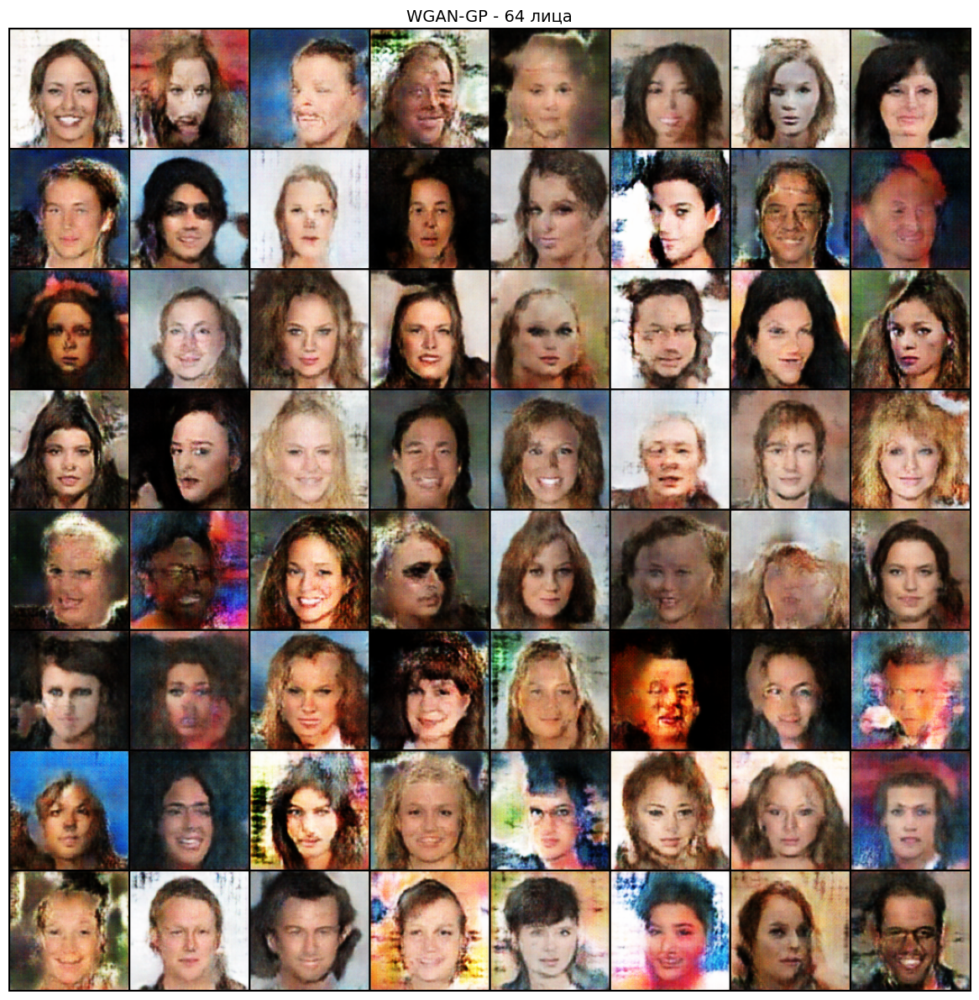

In [18]:
import pickle
hist_path = RUN_DIR / "history_w.pkl"

if 'history_w' not in dir() or history_w is None:
    if hist_path.exists():
        with open(hist_path, "rb") as f:
            history_w = pickle.load(f)
        print(f"history_w загружен из {hist_path}")
    else:
        history_w = None
        print("history_w.pkl не найден — будет показана только финальная сетка.")

if history_w is None:
    ckpt = torch.load(RUN_DIR / "wgan_gp.pt", map_location=device, weights_only=False)
    G_w = Generator().to(device); G_w.load_state_dict(ckpt["G"]); G_w.eval()
    with torch.no_grad():
        z = torch.randn(64, Z_DIM, device=device)
        fake = G_w(z).cpu()
    grid = make_grid(denorm(fake), nrow=8)
    plt.figure(figsize=(12, 12))
    plt.imshow(grid.permute(1, 2, 0).numpy()); plt.axis("off")
    plt.title("WGAN-GP - 64 лица", fontsize=14)
    plt.tight_layout(); plt.show()


## 18. FID и IS для WGAN-GP

In [18]:
print("Генерируем фейки WGAN-GP...")
fake_w = gather_fake(G_w, N_SAMPLES, conditional=False)
fid_w, is_w, isstd_w = compute_fid_is(real_u8, fake_w)
print(f"WGAN-GP | FID = {fid_w:.2f} | IS = {is_w:.3f} ± {isstd_w:.3f}")

print(f"\n{'='*45}")
print(f"  Модель    |  FID    |  IS")
print(f"  DCGAN     | {fid_dc:6.2f}  | {is_dc:.3f} ± {isstd_dc:.3f}")
print(f"  cGAN      | {fid_cg:6.2f}  | {is_cg:.3f} ± {isstd_cg:.3f}")
print(f"  WGAN-GP   | {fid_w:6.2f}  | {is_w:.3f} ± {isstd_w:.3f}")

Генерируем фейки WGAN-GP...
WGAN-GP | FID = 130.01 | IS = 1.048 ± 0.002

  Модель    |  FID    |  IS
  DCGAN     |  75.14  | 1.049 ± 0.002
  cGAN      | 120.79  | 1.046 ± 0.002
  WGAN-GP   | 130.01  | 1.048 ± 0.002
